In [5]:
import numpy as np
from PIL import Image
import time
import imageio
from deblur_functions import Wiener_deconv, RL, BRL, RL_energy, BRL_energy
from TV_functions import TVL1, TVL2, TVpoisson

In [231]:
import matplotlib.pyplot as plt
def show_pic(img, title=None, dpi=80):
    if dpi:
        fig = plt.figure(dpi=dpi)
    else:
        fig = plt.figure()
    if title: plt.suptitle(title, fontsize=16)
    plt.axis('off')
    plt.imshow(img, 'gray') if img.ndim == 2 else plt.imshow(img)
def save_pic(img, img_name, dr):
    img = Image.fromarray(img)
    img.save(dr+'/'+img_name+'.png')

## Define Testing Functions of Debluring

In [514]:
def test_deconvolutions(img_blurred, k_blurred):
    # Wiener
    SNR_F = 100.0

    Wiener_result = Wiener_deconv(img_blurred, k_blurred, SNR_F)

    print("Finish Wiener")

    # RL 
    max_iter_RL = 45

    RL_result = RL(img_blurred, k_blurred, max_iter_RL)

    print("Finish RL")

    # BRL
    max_iter_RL = 40
    rk = 12
    sigma_r = 25.0/255/255
    lamb_da = 0.001/255

    BRL_result = BRL(img_blurred, k_blurred, max_iter_RL, lamb_da, sigma_r, rk)

    print("Finish BRL")

    # TVL1
    max_iter = 1000
    lamb_da = 0.01

    TVL1_result = TVL1(img_blurred, k_blurred, max_iter, lamb_da)

    print("Finish TVL1")

    # TVL2
    max_iter = 1000
    lamb_da = 0.01

    TVL2_result = TVL2(img_blurred, k_blurred, max_iter, lamb_da)

    print("Finish TVL2")

    # TVpoisson
    max_iter = 1000
    lamb_da = 0.01

    TVpoisson_result = TVpoisson(img_blurred, k_blurred, max_iter, lamb_da)

    print("Finish TVpoisson")
    
    return Wiener_result, RL_result, BRL_result, TVL1_result, TVL2_result, TVpoisson_result

## Load Images

In [8]:
TEST_PAT_SIZE = "large"  # change "small" to "large" for high-resolution images but taking longer time for computing
TEST_BLUR = "medium"      # change "small" to "medium" for stronger-blur kernels but being harder to restore

img_original = np.asarray(Image.open(f'../data/curiosity.png'))
img_blurred = np.asarray(Image.open(f'../data/blurred_image_{TEST_PAT_SIZE}/curiosity_{TEST_BLUR}.png'))
k_blurred = np.asarray(Image.open(f'../data/kernel/kernel_{TEST_BLUR}.png'))  

Wiener_result, RL_result, BRL_result, TVL1_result, TVL2_result, TVpoisson_result = test_deconvolutions(img_blurred, k_blurred)

Finish Wiener
Estimated params [sigma = 1.000 | tau = 1.000 | theta = 1.000 | L_est = 1.0000]
iter 100: ||r||_2 = 221.837, eps_pri = 3.447, ||s||_2 = 43.502, eps_dual = 1.579
iter 200: ||r||_2 = 22.479, eps_pri = 3.228, ||s||_2 = 26.257, eps_dual = 1.577
iter 300: ||r||_2 = 15.261, eps_pri = 3.227, ||s||_2 = 18.632, eps_dual = 1.576
iter 400: ||r||_2 = 11.789, eps_pri = 3.227, ||s||_2 = 14.718, eps_dual = 1.576
iter 500: ||r||_2 = 9.402, eps_pri = 3.227, ||s||_2 = 11.951, eps_dual = 1.576
iter 600: ||r||_2 = 8.099, eps_pri = 3.227, ||s||_2 = 10.369, eps_dual = 1.576
iter 700: ||r||_2 = 6.994, eps_pri = 3.228, ||s||_2 = 9.119, eps_dual = 1.576
iter 800: ||r||_2 = 6.265, eps_pri = 3.228, ||s||_2 = 8.208, eps_dual = 1.576
iter 900: ||r||_2 = 5.626, eps_pri = 3.228, ||s||_2 = 7.434, eps_dual = 1.576
op = pc_iteration_tot, evals = 1000, total_time (ms) = 654803.0256729107, avg_time (ms) = 654.8030256729107
op = copyprev, evals = 1000, total_time (ms) = 16388.62711749971, avg_time (ms) = 16.

Finish TVpoisson


## Deblur Results

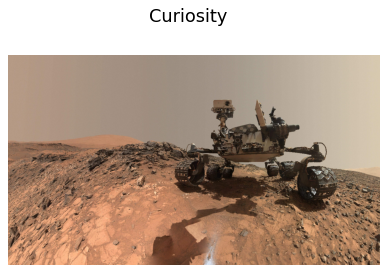

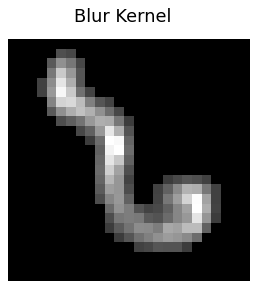

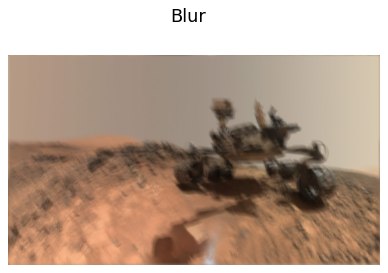

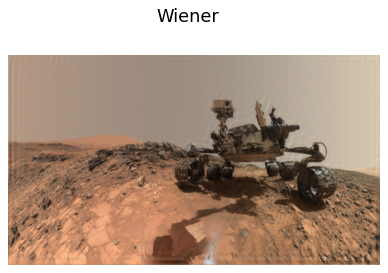

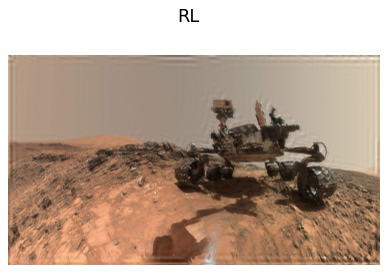

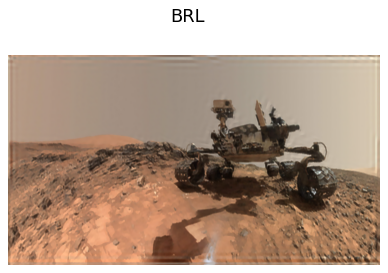

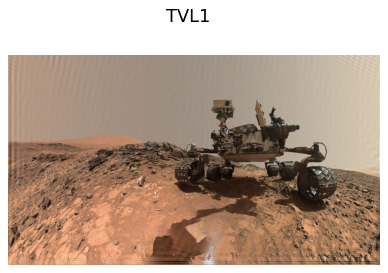

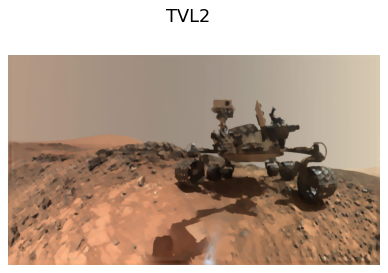

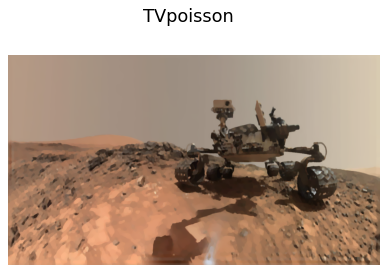

In [229]:
show_pic(img_original, "Curiosity")
show_pic(k_blurred, "Blur Kernel")
show_pic(img_blurred, "Blur")
show_pic(Wiener_result, "Wiener")
show_pic(RL_result, "RL")
show_pic(BRL_result, "BRL")
show_pic(TVL1_result, "TVL1")
show_pic(TVL2_result, "TVL2")
show_pic(TVpoisson_result, "TVpoisson")

## Analysis of Deblur Results of Different Methods

In [214]:
from numpy.fft import rfft, irfft

def normalize(FFT):
    return np.log10(np.abs(FFT))

def gray_rfft(img):
    img_gray = img.sum(axis=2)/3/255
    return normalize(rfft(img_gray[342]))

Oringal_FFT = gray_rfft(img_original)
Blurred_FFT = gray_rfft(img_blurred)
Wiener_FFT = gray_rfft(Wiener_result)
RL_FFT = gray_rfft(RL_result)
BRL_FFT = gray_rfft(BRL_result)
TVL1_FFT = gray_rfft(TVL1_result)
TVL2_FFT = gray_rfft(TVL2_result)
TVpoisson_FFT = gray_rfft(TVpoisson_result)

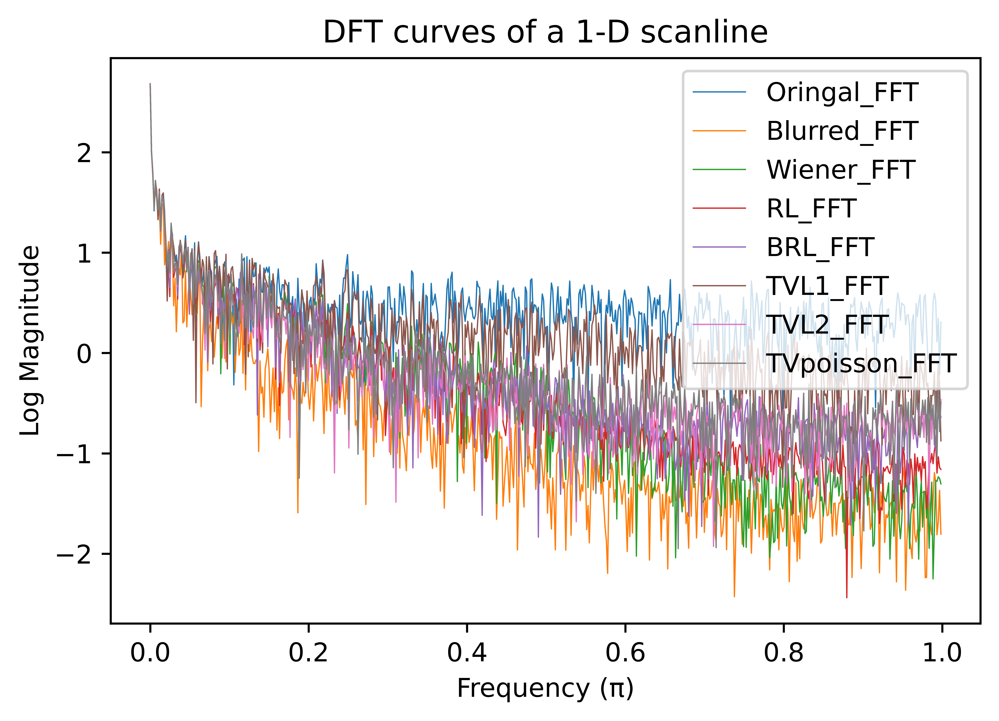

In [215]:
WIDTH = 0.5
plt.figure(dpi=1200)
x_range = np.array(list(range(len(Oringal_FFT))))/len(Oringal_FFT)
plt.plot(x_range, Oringal_FFT, linewidth=WIDTH)
plt.plot(x_range, Blurred_FFT, linewidth=WIDTH)
plt.plot(x_range, Wiener_FFT, linewidth=WIDTH)
plt.plot(x_range, RL_FFT, linewidth=WIDTH)
plt.plot(x_range, BRL_FFT, linewidth=WIDTH)
plt.plot(x_range, TVL1_FFT, linewidth=WIDTH)
plt.plot(x_range, TVL2_FFT, linewidth=WIDTH)
plt.plot(x_range, TVpoisson_FFT, linewidth=WIDTH)

plt.xlabel("Frequency (π)")
plt.ylabel("Log Magnitude")
plt.title("DFT curves of a 1-D scanline")
plt.legend(['Oringal_FFT', 'Blurred_FFT', 'Wiener_FFT', 'RL_FFT', 'BRL_FFT', 'TVL1_FFT', 'TVL2_FFT', 'TVpoisson_FFT'])
plt.show()

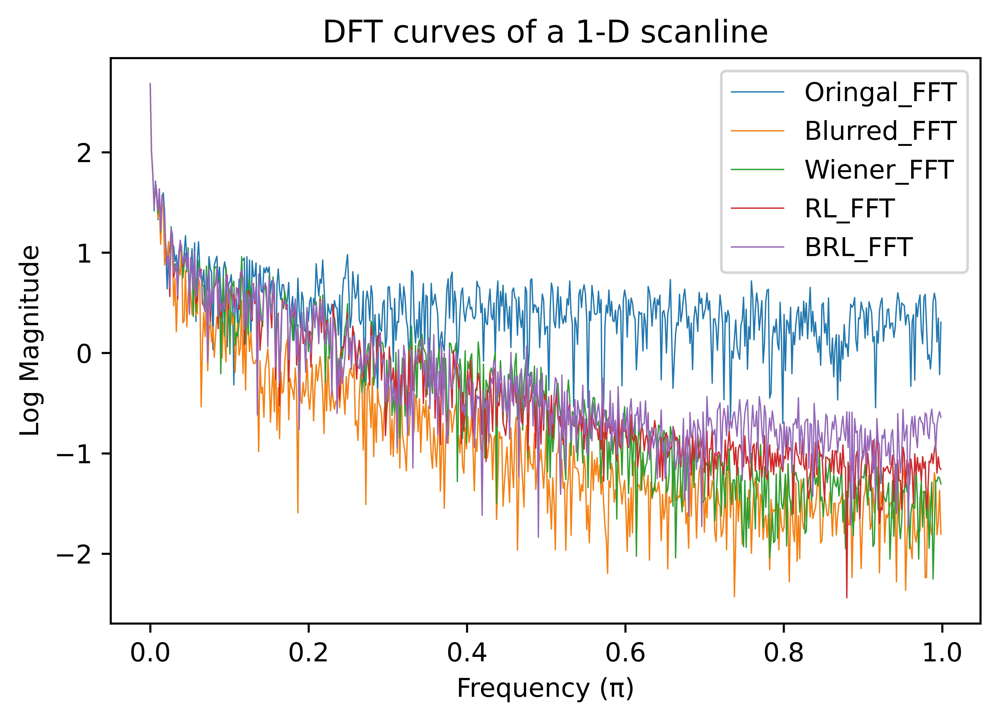

In [188]:
WIDTH = 0.5
plt.figure(dpi=1200)
x_range = np.array(list(range(len(Oringal_FFT))))/len(Oringal_FFT)
plt.plot(x_range, Oringal_FFT, linewidth=WIDTH)
plt.plot(x_range, Blurred_FFT, linewidth=WIDTH)
plt.plot(x_range, Wiener_FFT, linewidth=WIDTH)
plt.plot(x_range, RL_FFT, linewidth=WIDTH)
plt.plot(x_range, BRL_FFT, linewidth=WIDTH)
plt.xlabel("Frequency (π)")
plt.ylabel("Log Magnitude")
plt.title("DFT curves of a 1-D scanline")
plt.legend(['Oringal_FFT', 'Blurred_FFT', 'Wiener_FFT', 'RL_FFT', 'BRL_FFT'])
plt.show()

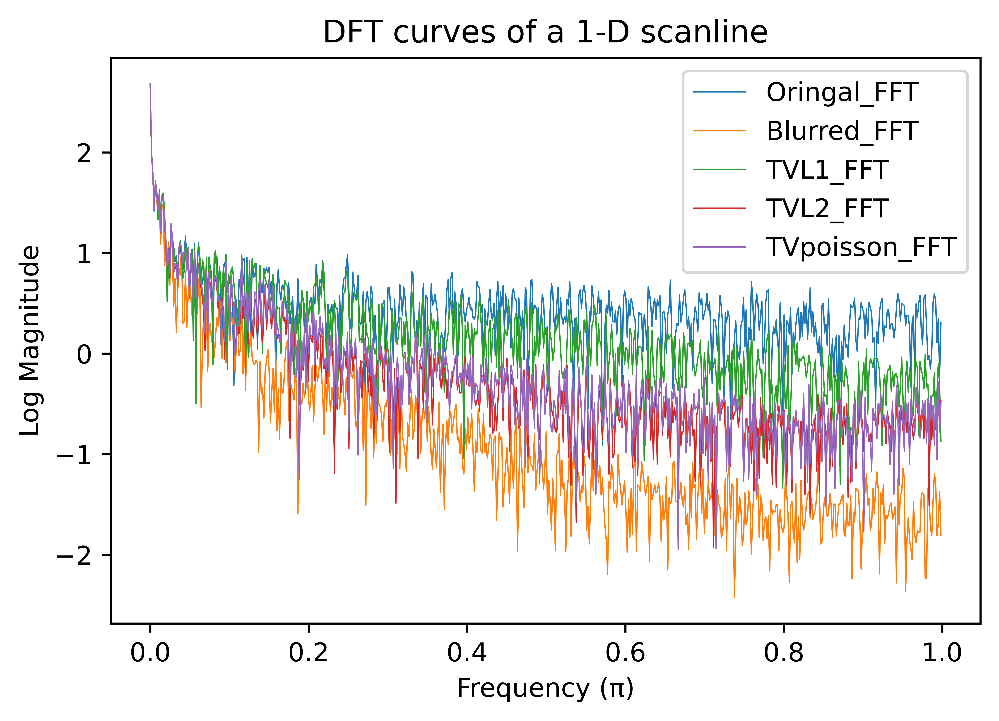

In [189]:
WIDTH = 0.5
plt.figure(dpi=1200)
x_range = np.array(list(range(len(Oringal_FFT))))/len(Oringal_FFT)
plt.plot(x_range, Oringal_FFT, linewidth=WIDTH)
plt.plot(x_range, Blurred_FFT, linewidth=WIDTH)
plt.plot(x_range, TVL1_FFT, linewidth=WIDTH)
plt.plot(x_range, TVL2_FFT, linewidth=WIDTH)
plt.plot(x_range, TVpoisson_FFT, linewidth=WIDTH)

plt.xlabel("Frequency (π)")
plt.ylabel("Log Magnitude")
plt.title("DFT curves of a 1-D scanline")
plt.legend(['Oringal_FFT', 'Blurred_FFT', 'TVL1_FFT', 'TVL2_FFT', 'TVpoisson_FFT'])
plt.show()